In [9]:
import os
import tqdm
import string
import seaborn as sns
import pandas as pd
import numpy as np
from random import shuffle
import matplotlib.pyplot as plt
%matplotlib inline
plt.rcParams["figure.figsize"] = (11, 7)
plt.rcParams["figure.dpi"] = 300
sns.set(rc={"figure.figsize": (11, 7)})

In [3]:
train_variant = pd.read_csv("training_variants")
test_variant = pd.read_csv("test_variants")
train_text = pd.read_csv("training_text", sep="\|\|", engine='python', header=None, skiprows=1, names=["ID","Text"])
test_text = pd.read_csv("test_text", sep="\|\|", engine='python', header=None, skiprows=1, names=["ID","Text"])
train = pd.merge(train_variant, train_text, how='left', on='ID')
train_y = train['Class'].values
train_x = train.drop('Class', axis=1)
train_size=train_x.shape[0]
# number of train data : 3321
test_x = pd.merge(test_variant, test_text, how='left', on='ID')
test_size=test_x.shape[0]
test_index = test_x['ID'].values
# number of test data : 5668
all_data = np.concatenate((train_x, test_x), axis=0)
all_data = pd.DataFrame(all_data)
all_data.columns = ["ID", "Gene", "Variation", "Text"]

In [14]:
train_variant.shape

(3321, 4)

In [15]:
test_variant.shape

(5668, 3)

In [19]:
train_variant.head()

,ID,Gene,Variation,Class
0,0,FAM58A,Truncating Mutations,1
1,1,CBL,W802*,2
2,2,CBL,Q249E,2
3,3,CBL,N454D,3
4,4,CBL,L399V,4


In [5]:
train_variant['Gene'].describe()

count      3321
unique      264
top       BRCA1
freq        264
Name: Gene, dtype: object

In [6]:
train_variant['Variation'].describe()

count                     3321
unique                    2996
top       Truncating Mutations
freq                        93
Name: Variation, dtype: object

In [4]:
test_variant.head()

,ID,Gene,Variation
0,0,ACSL4,R570S
1,1,NAGLU,P521L
2,2,PAH,L333F
3,3,ING1,A148D
4,4,TMEM216,G77A


In [9]:
test_variant['Gene'].describe()

count     5668
unique    1397
top         F8
freq       134
Name: Gene, dtype: object

In [8]:
test_variant['Variation'].describe()

count                     5668
unique                    5628
top       Truncating Mutations
freq                        18
Name: Variation, dtype: object

In [16]:
train_text.shape

(3321, 2)

In [5]:
train_text.head()

,ID,Text
0,0,Cyclin-dependent kinases (CDKs) regulate a var...
1,1,Abstract Background Non-small cell lung canc...
2,2,Abstract Background Non-small cell lung canc...
3,3,Recent evidence has demonstrated that acquired...
4,4,Oncogenic mutations in the monomeric Casitas B...


In [6]:
test_text.head()

,ID,Text
0,0,2. This mutation resulted in a myeloproliferat...
1,1,Abstract The Large Tumor Suppressor 1 (LATS1)...
2,2,Vascular endothelial growth factor receptor (V...
3,3,Inflammatory myofibroblastic tumor (IMT) is a ...
4,4,Abstract Retinoblastoma is a pediatric retina...


In [10]:
train_text.Text[0]

"Cyclin-dependent kinases (CDKs) regulate a variety of fundamental cellular processes. CDK10 stands out as one of the last orphan CDKs for which no activating cyclin has been identified and no kinase activity revealed. Previous work has shown that CDK10 silencing increases ETS2 (v-ets erythroblastosis virus E26 oncogene homolog 2)-driven activation of the MAPK pathway, which confers tamoxifen resistance to breast cancer cells. The precise mechanisms by which CDK10 modulates ETS2 activity, and more generally the functions of CDK10, remain elusive. Here we demonstrate that CDK10 is a cyclin-dependent kinase by identifying cyclin M as an activating cyclin. Cyclin M, an orphan cyclin, is the product of FAM58A, whose mutations cause STAR syndrome, a human developmental anomaly whose features include toe syndactyly, telecanthus, and anogenital and renal malformations. We show that STAR syndrome-associated cyclin M mutants are unable to interact with CDK10. Cyclin M silencing phenocopies CDK1

In [5]:
display(all_data.describe())

,ID,Gene,Variation,Text
count,8989,8989,8989,8989
unique,5668,1507,8609,7390
top,2833,BRCA1,Truncating Mutations,The PTEN (phosphatase and tensin homolog) phos...
freq,2,293,111,59


In [52]:
top_gene = pd.DataFrame({"Count": train.groupby('Gene').ID.count().nlargest(10).sort_values(ascending=False)})
top_gene

,Count
Gene,
BRCA1,264
TP53,163
EGFR,141
PTEN,126
BRCA2,125
KIT,99
BRAF,93
ERBB2,69
ALK,69


In [54]:
test_top_gene = pd.DataFrame({"Count": test_x.groupby('Gene').ID.count().nlargest(10).sort_values(ascending=False)})
test_top_gene

,Count
Gene,
F8,134
CFTR,57
F9,54
G6PD,46
GBA,39
PAH,38
AR,38
CASR,37
ARSA,30


In [56]:
top_train_var = pd.DataFrame({"Count": train.groupby('Variation').ID.count().nlargest(10).sort_values(ascending=False)})
top_train_var

,Count
Variation,
Truncating Mutations,93
Deletion,74
Amplification,71
Fusions,34
Overexpression,6
G12V,4
Q61R,3
Q61L,3
Q61H,3


In [58]:
top_test_var = pd.DataFrame({"Count": test_x.groupby('Variation').ID.count().nlargest(10).sort_values(ascending=False)})
top_test_var

,Count
Variation,
Truncating Mutations,18
Deletion,14
Amplification,8
Fusions,3
G44D,2
A1038V,1
A1035V,1
A1028V,1
A1020P,1


In [89]:
count_grp = train.groupby('Class')["Text_num_words"]
count_grp.describe()

,count,mean,std,min,25%,50%,75%,max
Class,,,,,,,,
1,568.0,9450.299296,6516.412101,1.0,4973.0,7305.0,12873.5,52972.0
2,452.0,9310.393805,7627.288722,116.0,4185.0,6810.0,12220.0,61957.0
3,89.0,6757.382022,3725.366918,1737.0,4283.0,5572.0,7415.0,27391.0
4,686.0,8983.390671,7280.220754,53.0,4566.0,6351.0,11537.0,43913.0
5,242.0,7517.049587,3902.868040,183.0,5245.0,6463.0,9513.5,24226.0
6,275.0,7184.120000,3836.912865,1.0,4505.5,6587.0,7847.0,24609.0
7,953.0,11442.867786,10111.940846,1.0,4871.0,8254.0,14620.0,76782.0
8,19.0,10814.421053,5648.714095,2111.0,5586.0,11253.0,15535.0,20626.0
9,37.0,12807.459459,10217.093429,1147.0,4942.0,10930.0,15797.0,45177.0


In [35]:
df=(train.Gene.value_counts(normalize=True)*100)
df[df>1].plot(kind='barh',title='% of GENES in training set')

In [36]:
df=(test_x.Gene.value_counts(normalize=True)*100)
df[df>=0.5].plot(kind='barh',title='% of GENES in test set')

In [48]:
num_common_genes=set(train.Gene).intersection(set(test_x.Gene))

print( 'Common genes in train and test {0}'.format(len(num_common_genes)))

Common genes in train and test 154


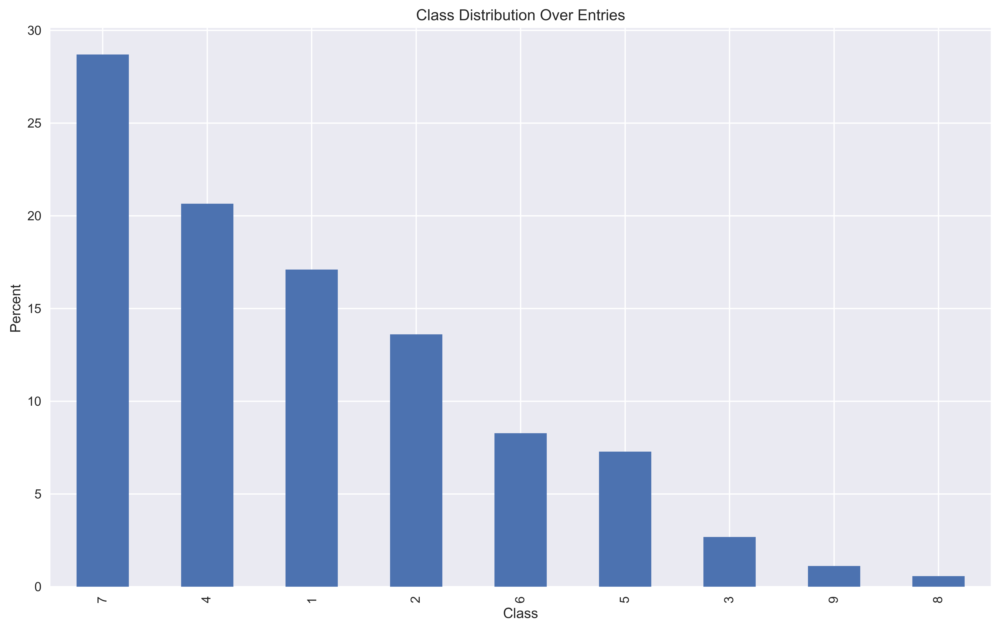

In [14]:
plt.figure()
ax = (train.groupby('Class').ID.count() / float(len(train)) * 100).sort_values(ascending=False).plot(kind='bar')

ax.set_title('Class Distribution Over Entries')
ax.set_xlabel('Class')
ax.set_ylabel('Percent')

plt.tight_layout()
#plt.show()
plt.savefig('images/class_distribution.png')

In [65]:
percent = train.groupby('Class').ID.count() / float(len(train)) * 100

tab = pd.DataFrame({
    "Percent of Total": round(percent, 2)})

#tab['Class'].sort_values()
tab

,Percent of Total
Class,
1,17.10
2,13.61
3,2.68
4,20.66
5,7.29
6,8.28
7,28.70
8,0.57
9,1.11


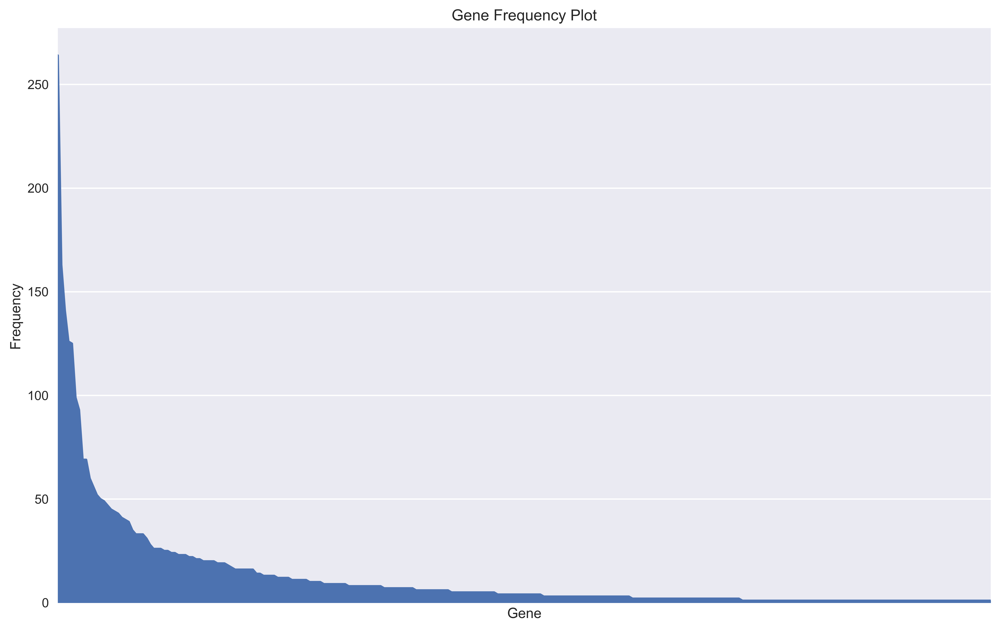

In [15]:
plt.figure()
ax = train['Gene'].value_counts().plot(kind='area')

ax.get_xaxis().set_ticks([])
ax.set_title('Gene Frequency Plot')
ax.set_xlabel('Gene')
ax.set_ylabel('Frequency')

plt.tight_layout()
plt.savefig('images/gene_freq_plot.svg')

Genes that appear less than 2 times: 26.89%
Genes that appear less than 5 times: 53.03%
Genes that appear less than 10 times: 71.59%
Genes that appear less than 20 times: 82.95%
Genes that appear less than 50 times: 95.08%
Genes that appear less than 100 times: 98.11%
Genes that appear less than 300 times: 100.0%


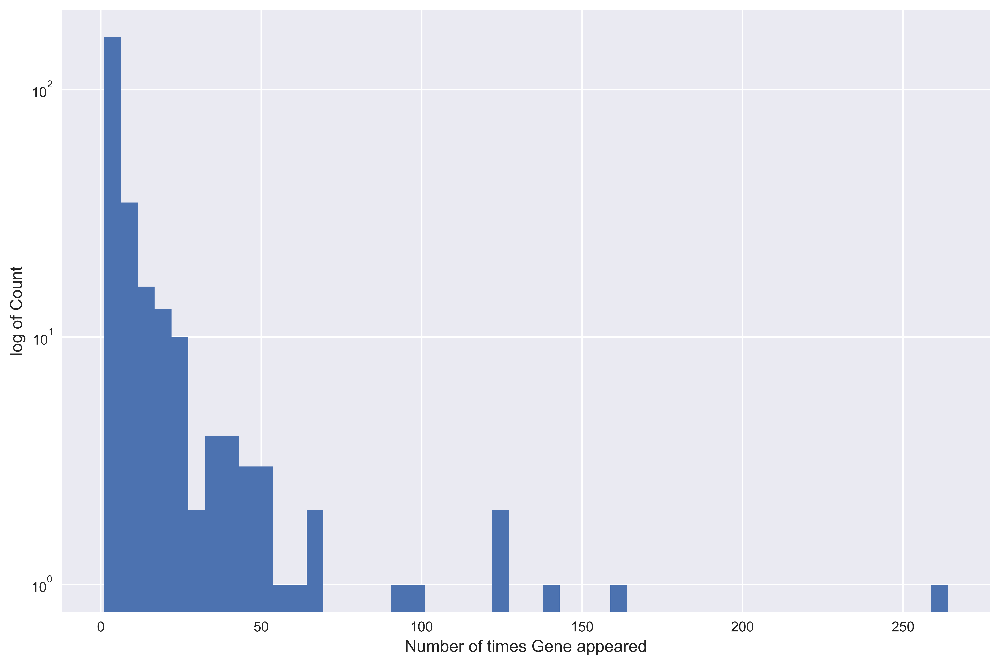

In [13]:
train_genes = train.groupby('Gene')['Gene'].count()

for i in [2, 5, 10, 20, 50, 100, 300]:
    print('Genes that appear less than {} times: {}%'.format(i, round((train_genes < i).mean() * 100, 2)))

plt.figure(figsize=(12, 8))
plt.hist(train_genes.values, bins=50, log=True)
plt.xlabel('Number of times Gene appeared', fontsize=12)
plt.ylabel('log of Count', fontsize=12)
plt.savefig('images/gene_appearences.svg')

In [12]:
train["Text_num_words"] = train["Text"].apply(lambda x: len(str(x).split()) )
train["Text_num_chars"] = train["Text"].apply(lambda x: len(str(x)) )

In [13]:
test_x["Text_num_words"] = test_x["Text"].apply(lambda x: len(str(x).split()) )
test_x["Text_num_chars"] = test_x["Text"].apply(lambda x: len(str(x)) )

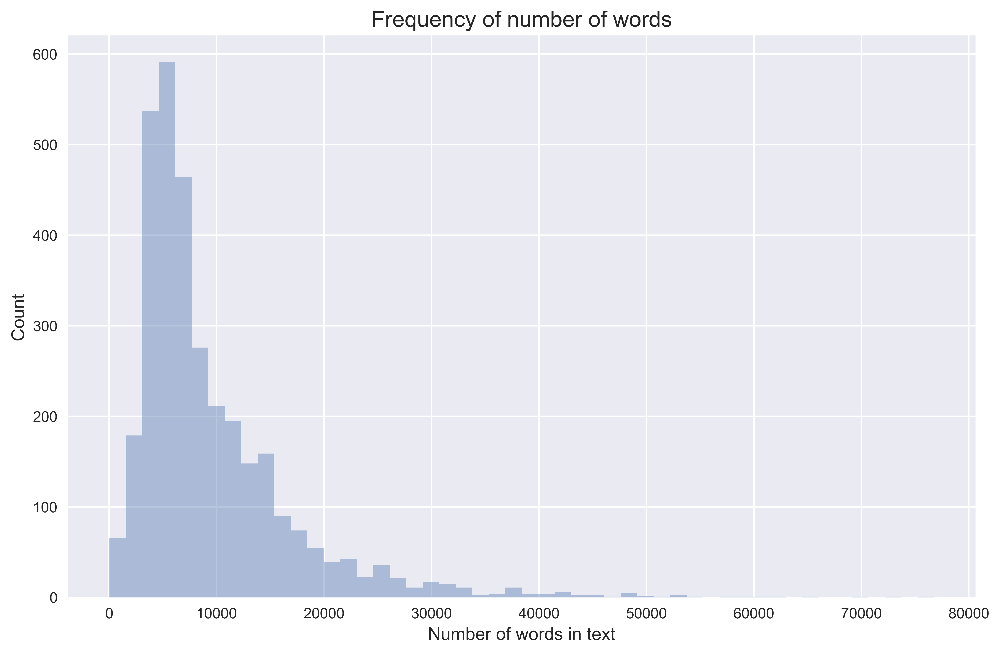

In [7]:
sns.distplot(train.Text_num_words.values, bins=50, kde=False)
plt.xlabel('Number of words in text', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.title("Frequency of number of words", fontsize=15)
plt.savefig('images/freq_num_words.svg')

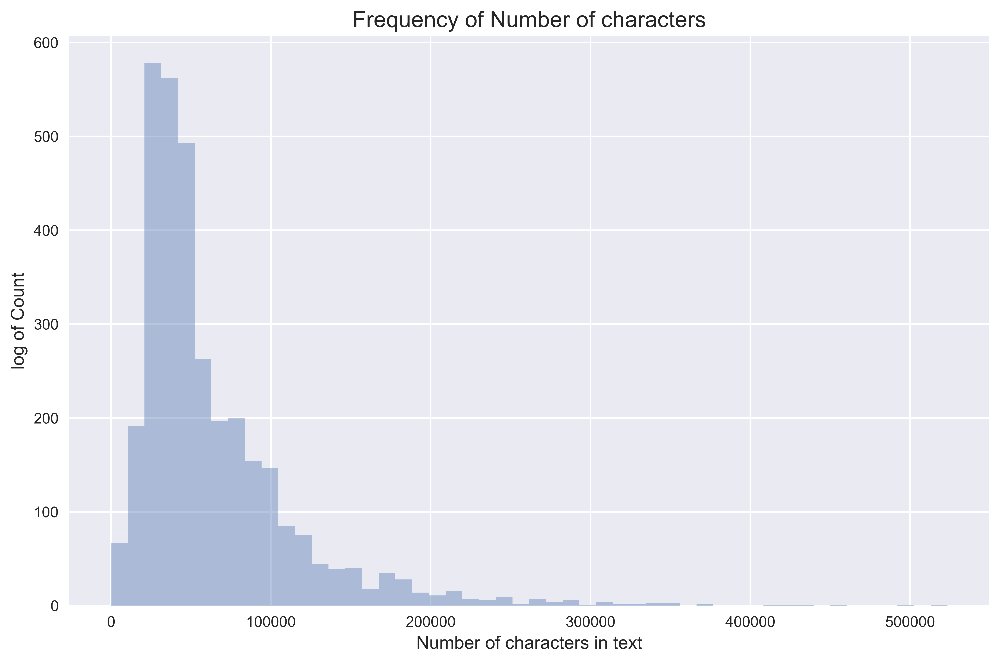

In [8]:
sns.distplot(train.Text_num_chars.values, bins=50, kde=False)
plt.xlabel('Number of characters in text', fontsize=12)
plt.ylabel('log of Count', fontsize=12)
plt.title("Frequency of Number of characters", fontsize=15)
plt.savefig('images/freq_num_chars.svg')

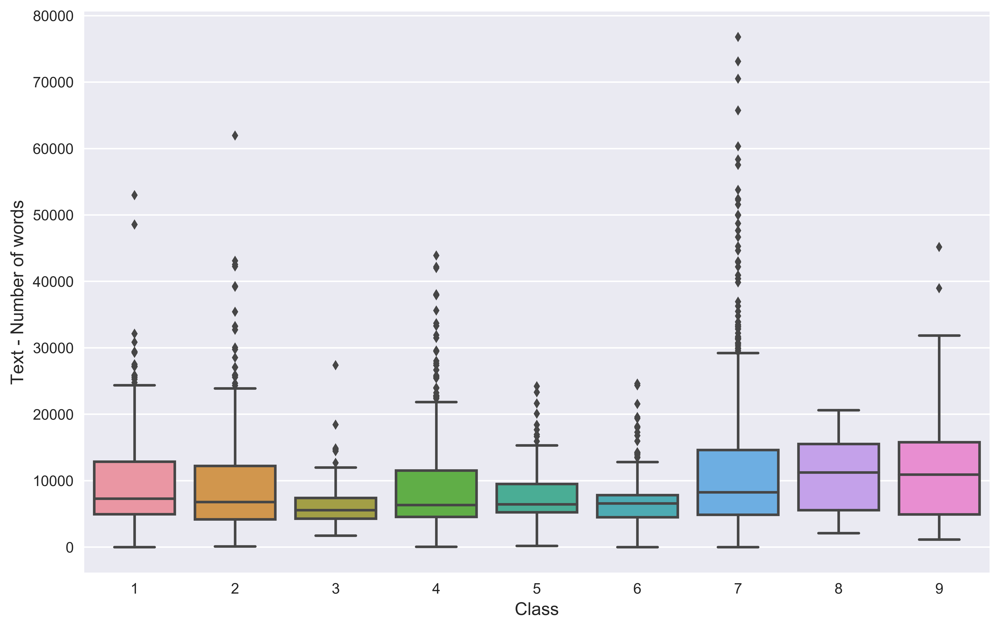

In [9]:
sns.boxplot(x='Class', y='Text_num_words', data=train)
plt.xlabel('Class', fontsize=12)
plt.ylabel('Text - Number of words', fontsize=12)
plt.savefig('images/num_word_by_class_violin.svg')


In [7]:
train_top=train.Gene.value_counts(normalize=True)*100
top_genes=train_top[train_top>1].index
uq=train.Class.unique()
train_top_genes=train[train.Gene.isin(top_genes)]
topGenes=train_top_genes.Gene.unique()

test_top_genes=test_x[test_x.Gene.isin(top_genes)]

In [20]:
#For every class find out what is the most predominant genes
plt.rcParams["figure.figsize"] = (20,10)
row=0
col=0
fig, axes = plt.subplots(nrows=3, ncols=3)
#pylab.gca().get_ylabel().set_fontsize(10)
for i in range(0,len(uq)):
    ax1=axes[row,col]
    train_top_genes[train_top_genes.Class==uq[i]].Gene.value_counts().reindex(topGenes).plot(kind='bar', ax=ax1, title=uq[i])
    plt.subplots_adjust(top=1.3)
    ax1.set_yticks(np.arange(0,105, 5))

    col=col+1
    if(col==3):
        col=0
        row=row+1
plt.savefig('images/top_genes_by_class', bbox_inches = 'tight')

In [19]:
plt.rcParams["figure.figsize"] = (10,10)
fig, axes = plt.subplots(nrows=11, ncols=2)

uq_genes=train_top_genes.Gene.unique()
row=0
col=0
for i in range(0,len(uq_genes)):
    ax1=axes[row,col]

    train_top_genes[train_top_genes.Gene==uq_genes[i]].Class.value_counts().reindex(uq).plot(kind='bar',ax=ax1,title=uq_genes[i])
    col=col+1
    if(col==2):
        col=0
        row=row+1
    plt.subplots_adjust(top=3.5)
plt.savefig('images/top_gene_class_freq.svg', bbox_inches = 'tight')

In [16]:
train_num_words = pd.DataFrame({"Count": round(train.Text_num_words.describe(), 0)})
train_num_words

,Count
count,3321.0
mean,9551.0
std,7849.0
min,1.0
25%,4733.0
50%,6871.0
75%,11996.0
max,76782.0


In [17]:
test_num_words = pd.DataFrame({"Count": round(test_x.Text_num_words.describe(), 0)})
test_num_words

,Count
count,5668.0
mean,8473.0
std,3555.0
min,1.0
25%,6382.0
50%,8346.0
75%,10213.0
max,73607.0


In [18]:
#For every class find out what is the number of words
plt.rcParams["figure.figsize"] = (20,10)
row=0
col=0
fig, axes = plt.subplots(nrows=3, ncols=3)

for i in range(0,len(uq)):
    ax1=axes[row,col]
    ax1.set_ylim(0,0.000175)
    ax1.set_title('Class '+str(i+1), fontsize =16)
    sns.kdeplot(train.loc[train.Class==uq[i],'Text_num_words'],ax=ax1,shade=True)

    plt.subplots_adjust(top=1.3)

    col=col+1
    if(col==3):
        col=0
        row=row+1
plt.savefig('images/num_words_by_class.svg', bbox_inches = 'tight')        

In [4]:
df = train.groupby('Class').Text.sum()

In [11]:
plt.rcParams["figure.figsize"] = (20,15)
row=0
col=0
fig, axes = plt.subplots(nrows=5, ncols=2)

for i in range(0,len(uq)):
    ax1=axes[row, col]
    ax1.set_ylim(0,70000)
    ax1.set_title('Class '+ str(i+1), fontsize = 16)


    pd.Series(pd.Series(df.loc[uq[i]]).str.split()[0]).value_counts().sort_values(ascending=False)[:50].plot(kind='barh',ax=ax1)
    plt.subplots_adjust(top=3)

    col=col+1
    if(col==2):
        col=0
        row=row+1
plt.savefig('images/word_freq_by_class.svg', bbox_inches = 'tight')

In [23]:
import nltk
from collections import Counter
from nltk.corpus import stopwords
from string import punctuation
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/olliegraham/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [24]:
custom_words = ["fig", "figure", "et", "al", "al.", "also",
                "data", "analyze", "study", "table", "using",
                "method", "result", "conclusion", "author", 
                "find", "found", "show", '"', "’", "“", "”"]

stop_words = set(stopwords.words('english') + list(punctuation) + custom_words)
wordnet_lemmatizer = WordNetLemmatizer()

In [25]:
class_corpus = train.groupby('Class').apply(lambda x: x['Text'].str.cat())

In [26]:
class_corpus = class_corpus.apply(lambda x: Counter(
    [wordnet_lemmatizer.lemmatize(w) 
     for w in word_tokenize(x) 
     if w.lower() not in stop_words and not w.isdigit()]
))

In [27]:
class_freq = class_corpus.apply(lambda x: x.most_common(5))
class_freq = pd.DataFrame.from_records(class_freq.values.tolist()).set_index(class_freq.index)

def normalize_row(x):
    label, repetition = zip(*x)
    t = sum(repetition)
    r = [n/t for n in repetition]
    return list(zip(label,r))

class_freq = class_freq.apply(lambda x: normalize_row(x), axis=1)

# set unique colors for each word so it's easier to read
all_labels = [x for x in class_freq.sum().sum() if isinstance(x,str)]
unique_labels = set(all_labels)
cm = plt.get_cmap('Blues_r', len(all_labels))
colors = {k:cm(all_labels.index(k)/len(all_labels)) for k in all_labels}

fig, ax = plt.subplots()

offset = np.zeros(9)
for r in class_freq.iteritems():
    label, repetition = zip(*r[1])
    ax.barh(range(len(class_freq)), repetition, left=offset, color=[colors[l] for l in label])
    offset += repetition
    
ax.set_yticks(np.arange(len(class_freq)))
ax.set_yticklabels(class_freq.index)
ax.invert_yaxis()

# annotate words
offset_x = np.zeros(9) 
for idx, a in enumerate(ax.patches):
    fc = 'k' if sum(a.get_fc()) > 2.5 else 'w'
    ax.text(offset_x[idx%9] + a.get_width()/2, a.get_y() + a.get_height()/2, 
            '{}\n{:.2%}'.format(all_labels[idx], a.get_width()), 
            ha='center', va='center', color=fc, fontsize=14, family='monospace')
    offset_x[idx%9] += a.get_width()
    
ax.set_title('Most common words in each class')
ax.set_xlabel('Word Frequency')
ax.set_ylabel('Classes')

plt.tight_layout()
plt.savefig('images/most_common_words_class.svg', bbox_inches = 'tight')

In [28]:
whole_text_freq = class_corpus.sum()

fig, ax = plt.subplots()

label, repetition = zip(*whole_text_freq.most_common(25))

ax.barh(range(len(label)), repetition, align='center')
ax.set_yticks(np.arange(len(label)))
ax.set_yticklabels(label)
ax.invert_yaxis()

ax.set_title('Word Distribution Over Whole Text')
ax.set_xlabel('# of repetitions')
ax.set_ylabel('Word')

plt.tight_layout()
plt.savefig('images/word_dist_whole_text.svg', bbox_inches = 'tight')